<a href="https://colab.research.google.com/github/DarshanPatel0919/Algorithmic-Graph-Theory/blob/main/DIP_Lab5_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Libraries

In [1]:
import numpy as np
from matplotlib.pyplot import *
import cv2
import warnings
warnings.filterwarnings("ignore")
import time

# Load Data

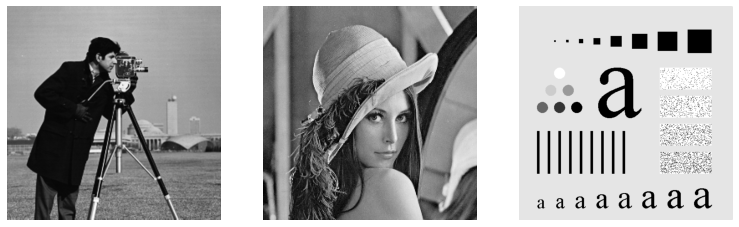

In [3]:
root = '/content/'

camera_path = root + 'cameraman.tif'
lena_path = root + 'lena_gray_256.tif'
char_path = root + 'character.tif'

images = {}
titles = ['Cameraman', 'Lena', 'Character']

images[0] = imread(camera_path)
images[1] = imread(lena_path)
images[2] = imread(char_path)

figure(figsize=(13,4))
for i in range(3):
  subplot(1,3,i+1)
  imshow(images[i],'gray')
  axis('off')

## Note :  Input image data-type and output image data-type for every filter must be same

# Utility Functions

In [4]:
## takes an image as an input and returns a noisy image with given fraction of noise
def noisy(image, fraction= 0.01):

    res = np.copy(image)
    dimension = np.prod(res.shape) 
    image_pixels = range(dimension)
    noisy_pixels = np.random.choice(image_pixels,int(dimension*fraction))

    for pixel in noisy_pixels:
      i = pixel//image.shape[0]
      j = pixel%image.shape[1]
      ## salt = 255, pepper = 0
      res[i][j] = np.random.randint(0,1)*255

    return res

In [5]:
def scaled(image):
    res = np.copy(image).astype(np.float64)
    return ((res-np.min(res))*255/np.max(res)).astype(np.uint8)

#Question 1

In [311]:
### This is generalized function for applying all filters
def apply_filter(image, filter_function, mask):
    ## filter_function will be question specific, that will be defined for every type of filter individually
    
    im = np.copy(image)
    
    r, c = im.shape
    r = r - mask + 1
    c = c - mask + 1
    
    res = np.ones((r, c))

    for i in range(r):
        for j in range(c):
            mask_image = np.copy(im[i:i+mask, j:j+mask])
            res[i][j] = filter_function(mask_image)
    
    return res

##(i)  Linear Filter

In [312]:
def average_filter(mask_image):
    w = np.ones(mask_image.shape)
    res = np.multiply(w,mask_image)
    return np.sum(res) 

========================================= Without Noise =====================================


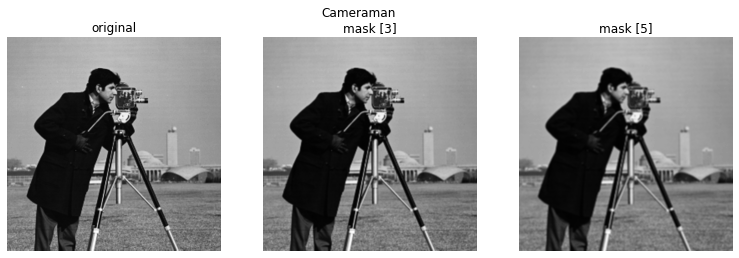

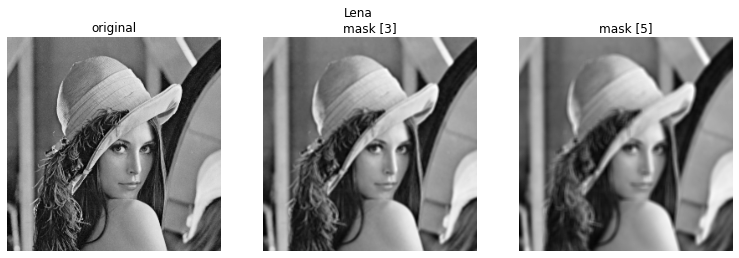

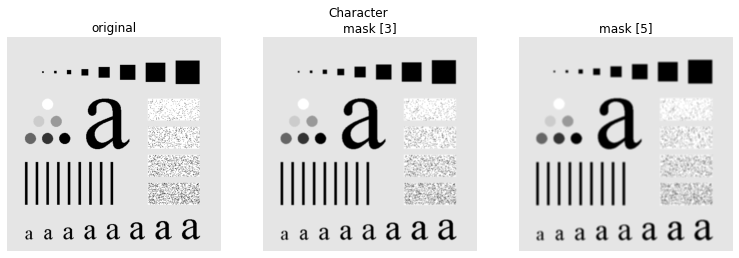

In [313]:
print("========================================= Without Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(images[i], average_filter, masks[j])
    imshow(scaled(g),'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

========================================= With Noise =====================================


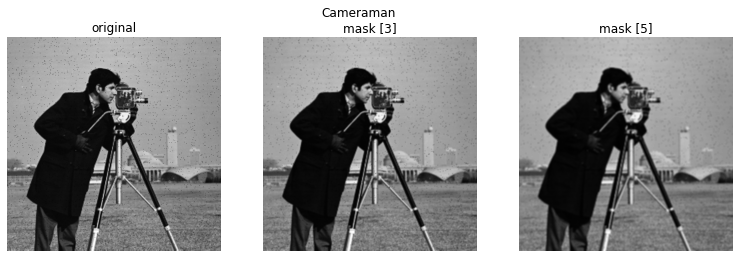

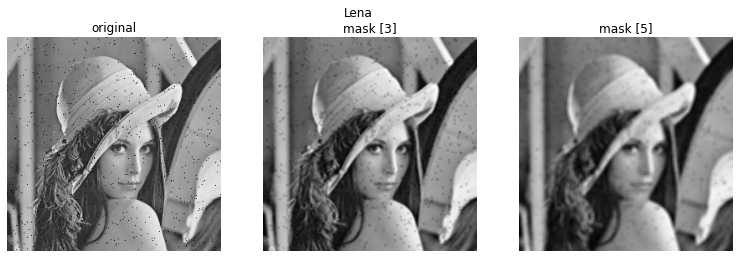

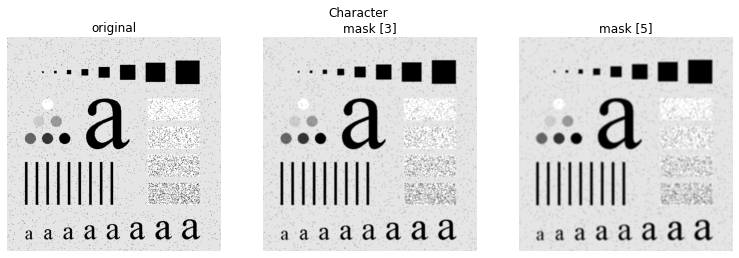

In [314]:
print("========================================= With Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(noisy(images[i]), average_filter, masks[j])
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

##(ii)  Smoothing Linear Filters (Average Filter)

In [315]:
def linear_filter(mask_image):
    w = np.ones(mask_image.shape)
    res = np.multiply(w,mask_image)
    return np.sum(res)/np.sum(w) 

========================================= Without Noise =====================================


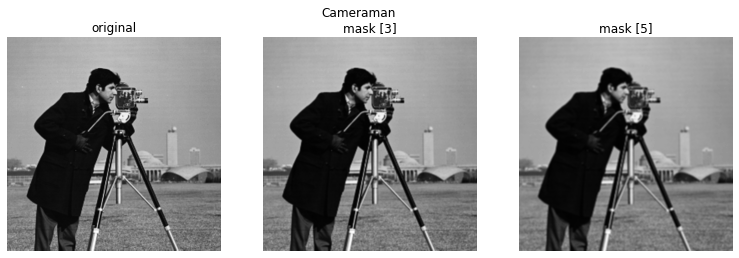

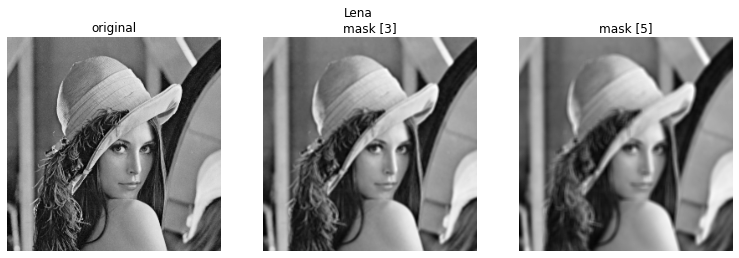

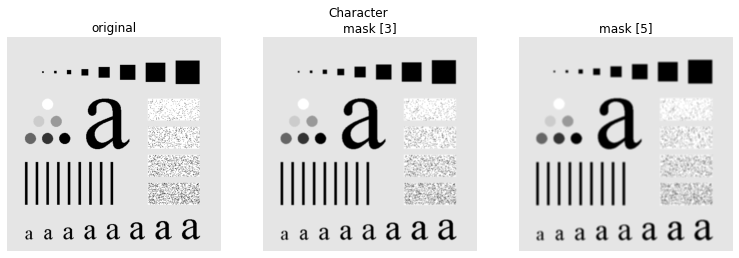

In [316]:
print("========================================= Without Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(images[i], linear_filter, masks[j])
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

========================================= With Noise =====================================


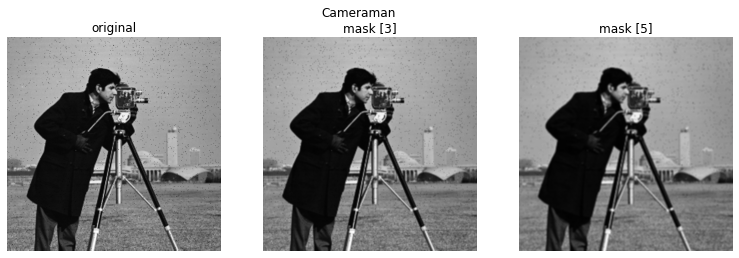

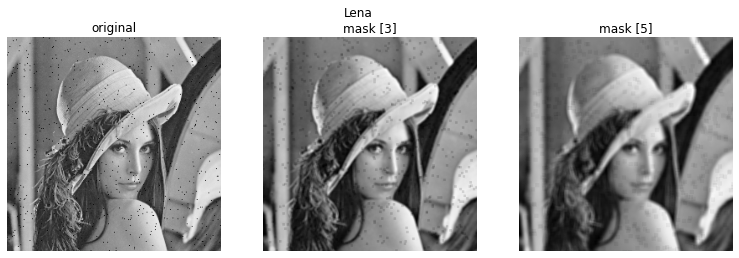

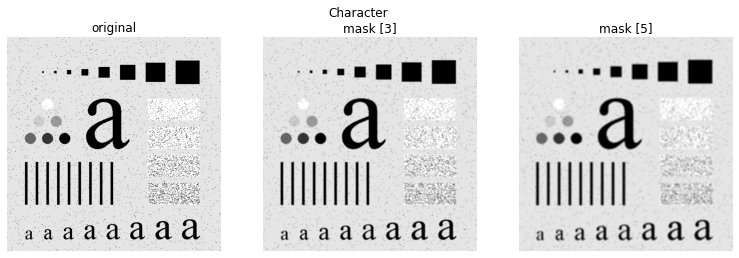

In [317]:
print("========================================= With Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(noisy(images[i]), linear_filter, masks[j])
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

##(iii). Order-Statistics Filter (Median Filter)

In [318]:
def median_filter(mask_image):
    return np.median(mask_image)

========================================= Without Noise =====================================


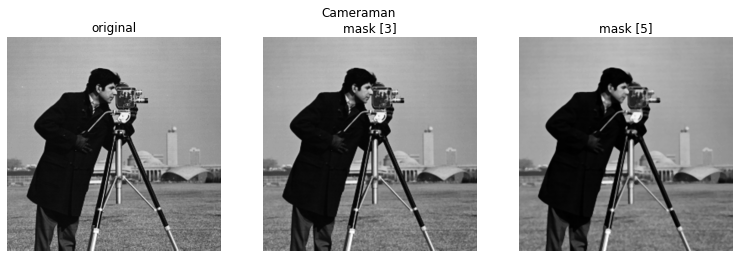

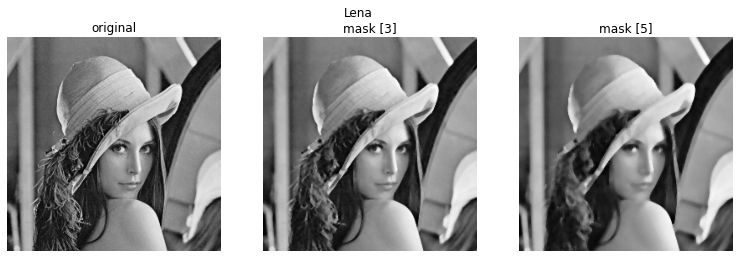

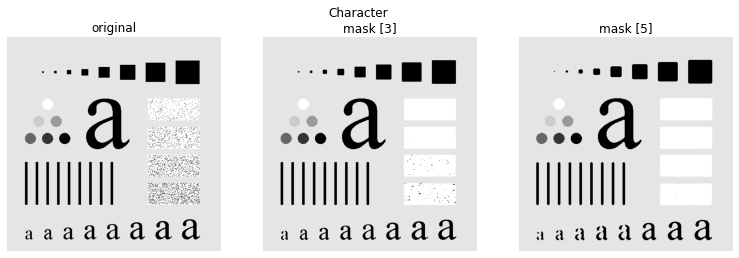

In [319]:
print("========================================= Without Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(images[i], median_filter, masks[j])
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

========================================= With Noise =====================================


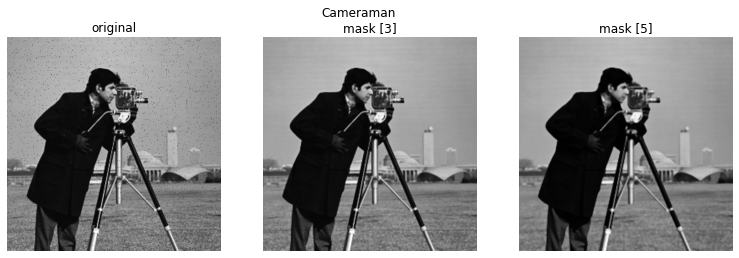

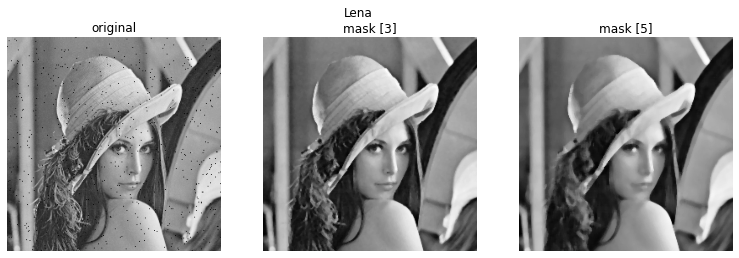

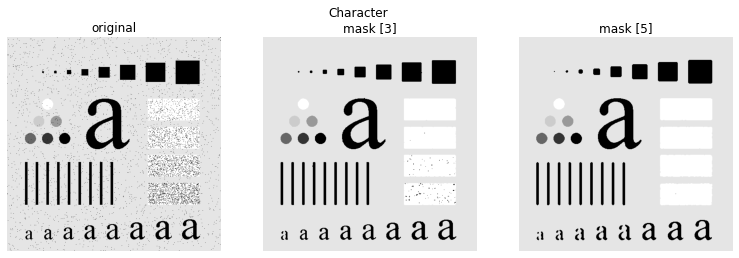

In [320]:
print("========================================= With Noise =====================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(13,4))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(noisy(images[i]), median_filter, masks[j])
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

##(iv). Laplacian Filter

In [321]:
def laplacian_filter(mask_image):
    w = np.array([[-1,-1,-1],[-1,8,-1],[-1,-1,-1]])
    im = np.copy(mask_image)
    res = np.multiply(w,im)
    return np.sum(res)

============================================== Without Noise ==========================================


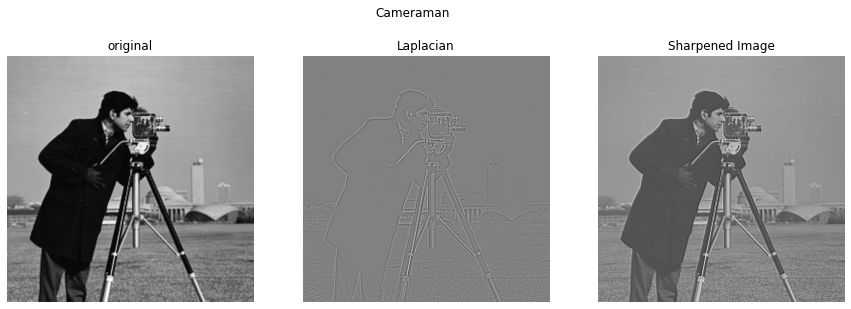

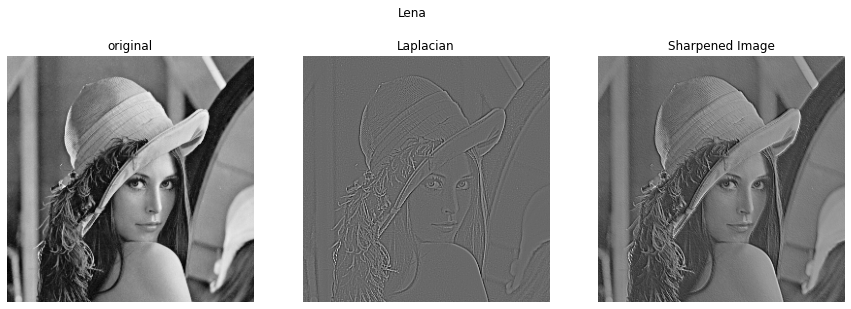

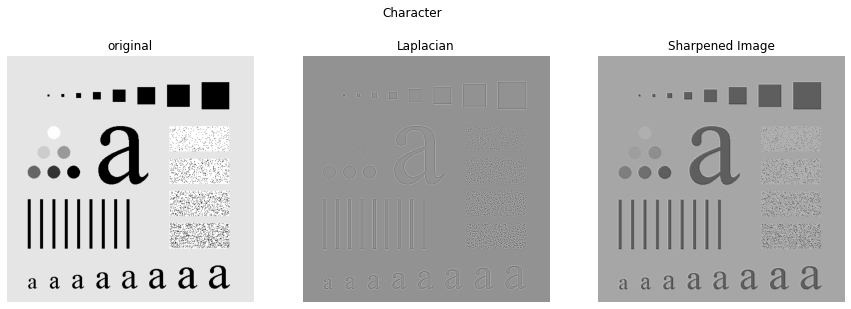

In [322]:
print("============================================== Without Noise ==========================================")
masks = [3]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(len(masks)):
    subplot(1,3,1)
    imshow(images[i],'gray')
    axis('off')
    title( 'original')
    subplot(1,3,2)
    g = apply_filter(images[i], laplacian_filter, masks[j])
    imshow(g,'gray')
    axis('off')
    title( 'Laplacian' )
    subplot(1,3,3)
    sz = images[i].shape
    s1,s2 = sz[0]-2, sz[1]-2
    sharp = images[i][:s1,:s2] + scaled(g)
    imshow(sharp,'gray')
    title( 'Sharpened Image')
    axis('off')
  suptitle(titles[i])
  show()

============================================== Without Noise ==========================================


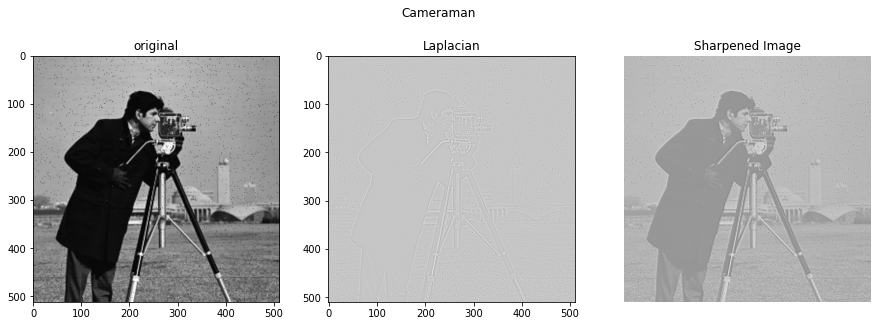

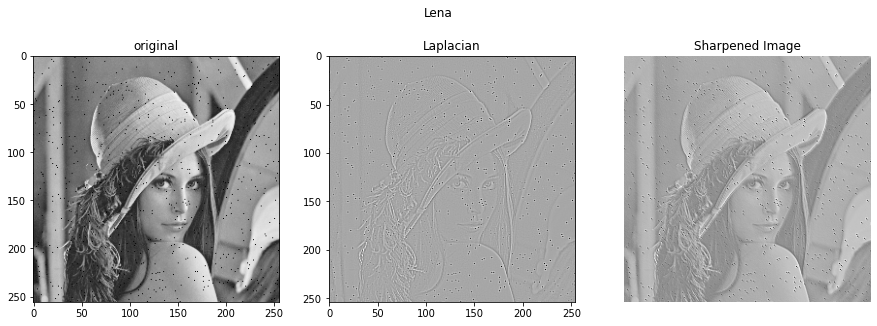

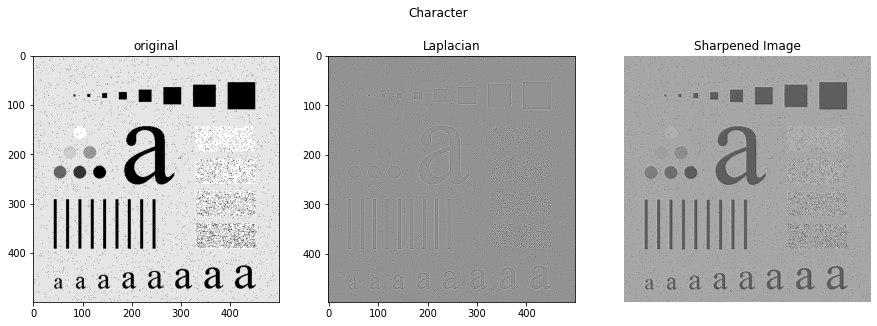

In [323]:
print("============================================== Without Noise ==========================================")
masks = [3]
for i in range(3):
  figure(figsize=(15,5))
  noisy_image = noisy(images[i])
  for j in range(len(masks)):
    subplot(1,3,1)
    imshow(noisy_image,'gray')
    title( 'original')
    subplot(1,3,2)
    g = apply_filter(noisy_image, laplacian_filter, masks[j])
    imshow(g,'gray')
    title( 'Laplacian' )
    subplot(1,3,3)
    sz = noisy_image.shape
    s1,s2 = sz[0]-2, sz[1]-2
    sharp = noisy_image[:s1,:s2] + scaled(g)
    imshow(sharp,'gray')
    title( 'Sharpened Image')
    axis('off')
  suptitle(titles[i])
  show()

##(v). Unsharp Masking

In [324]:
def lowpass_filter(mask_image):
    normalized_weight = 1 / (mask_image.shape[0]**2)
    w = np.full(mask_image.shape,normalized_weight)
    res = np.multiply(w,mask_image)
    return np.sum(res)

============================================== Without Noise ==========================================


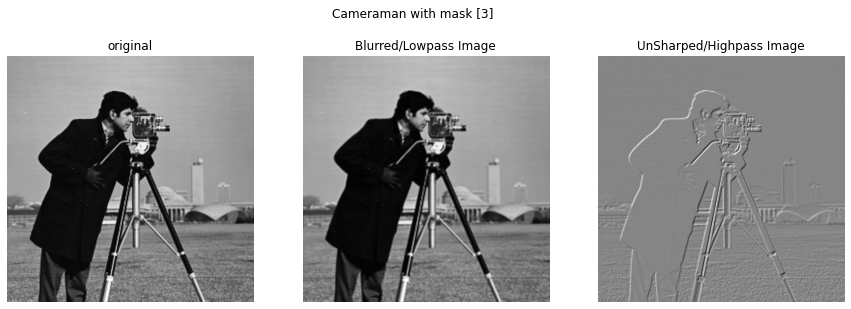

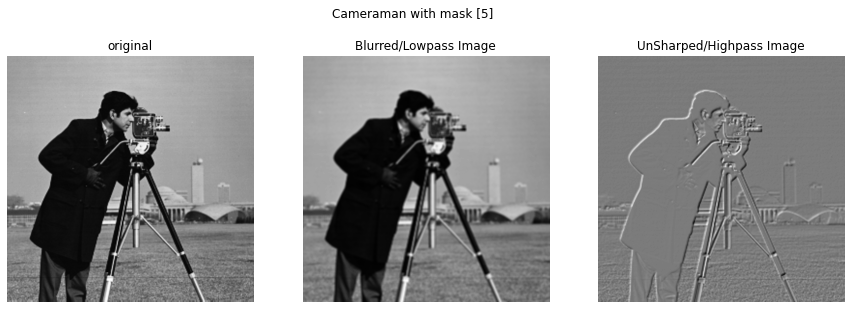

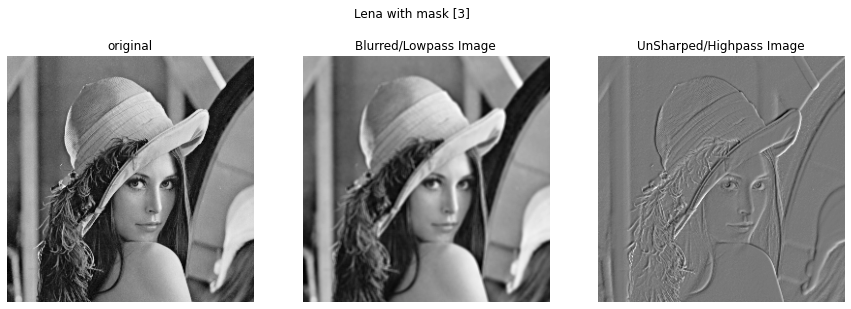

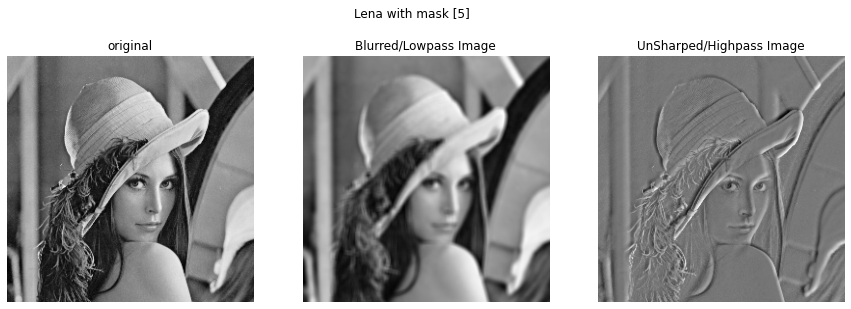

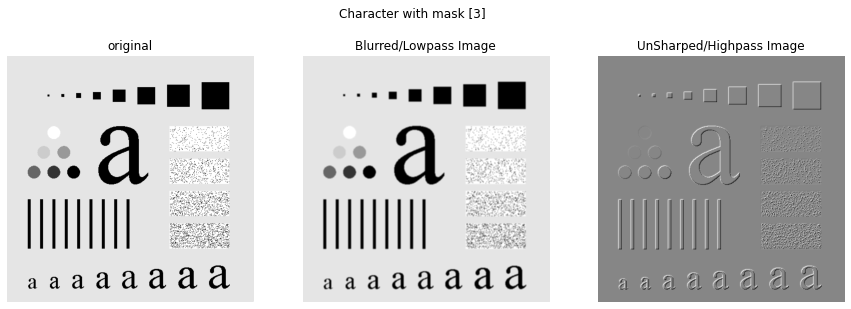

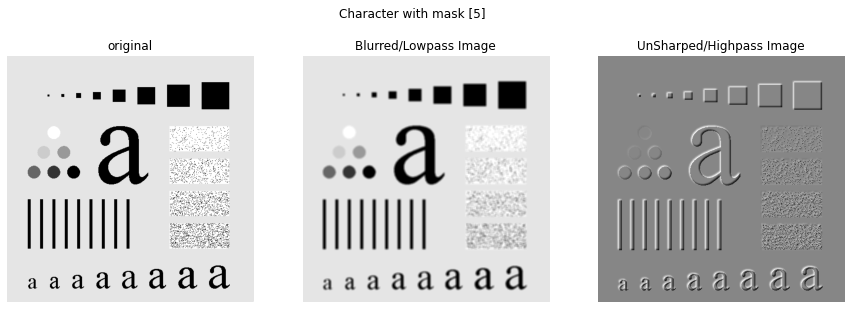

In [325]:
print("============================================== Without Noise ==========================================")
masks = [3,5]
for i in range(3):  
  for j in range(len(masks)):
    figure(figsize=(15,5))
    subplot(1,3,1)
    imshow(images[i],'gray')
    axis('off')
    title( 'original')
    subplot(1,3,2)
    g = apply_filter(images[i], lowpass_filter, masks[j])
    imshow(g,'gray')
    axis('off')
    title( 'Blurred/Lowpass Image' )
    subplot(1,3,3)
    sz = images[i].shape
    s1,s2 = sz[0]-masks[j]+1, sz[1]-masks[j]+1
    sharp = images[i][:s1,:s2] - g
    imshow(sharp,'gray')
    title( 'UnSharped/Highpass Image')
    axis('off')
    suptitle(titles[i]+' with mask ['+str(masks[j])+ ']')
    show()

============================================== With Noise ==========================================


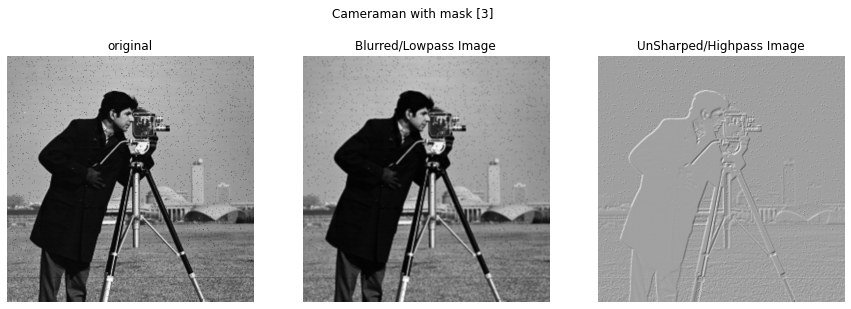

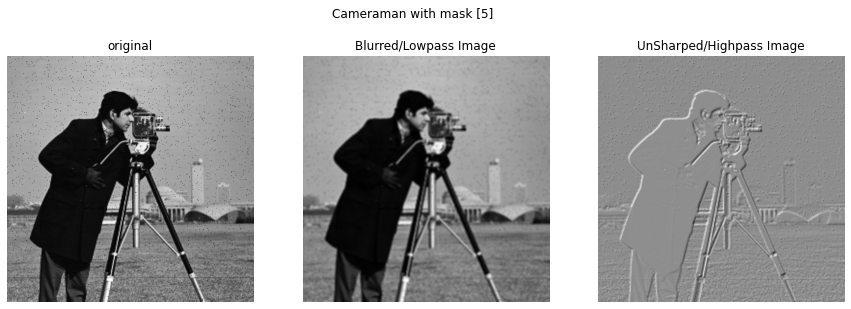

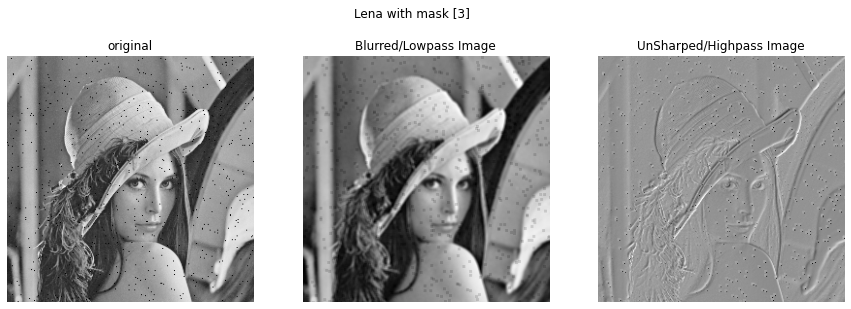

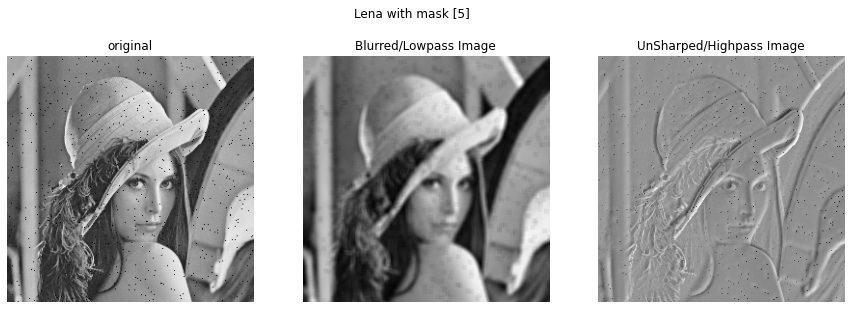

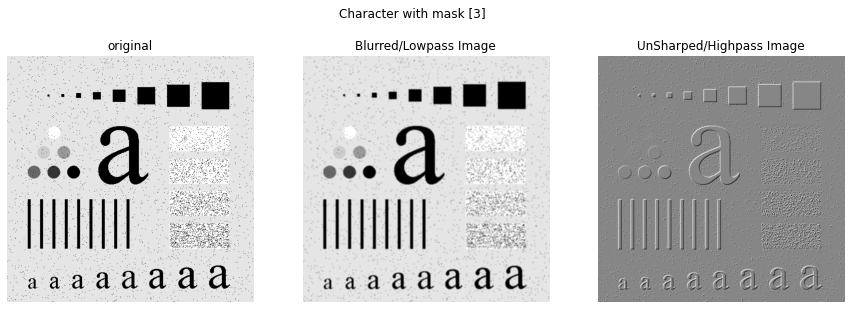

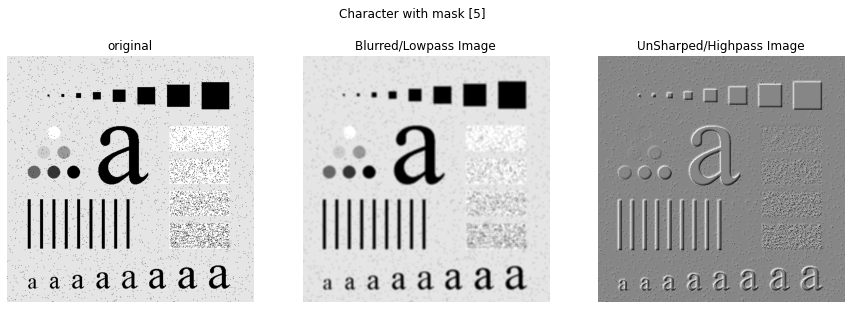

In [326]:
print("============================================== With Noise ==========================================")
masks = [3,5]
for i in range(3):  
  noise_image = noisy(images[i])
  for j in range(len(masks)):
    figure(figsize=(15,5))
    subplot(1,3,1)
    imshow(noise_image,'gray')
    axis('off')
    title( 'original')
    subplot(1,3,2)
    g = apply_filter(noise_image, lowpass_filter, masks[j])
    imshow(g,'gray')
    axis('off')
    title( 'Blurred/Lowpass Image' )
    subplot(1,3,3)
    sz = noise_image.shape
    s1,s2 = sz[0]-masks[j]+1, sz[1]-masks[j]+1
    sharp = noise_image[:s1,:s2] - scaled(g)
    imshow(sharp,'gray')
    title( 'UnSharped/Highpass Image')
    axis('off')
    suptitle(titles[i]+' with mask ['+str(masks[j])+ ']')
    show()

##(vi). High Boost Filtering

In [327]:
def highboost_filter(mask_image):
    n = mask_image.shape[0]
    w = np.full(mask_image.shape,1)
    lowpass = np.multiply(w,mask_image).astype(float)
    return np.sum(lowpass)

============================================== Without Noise : A = 1.4 ==========================================


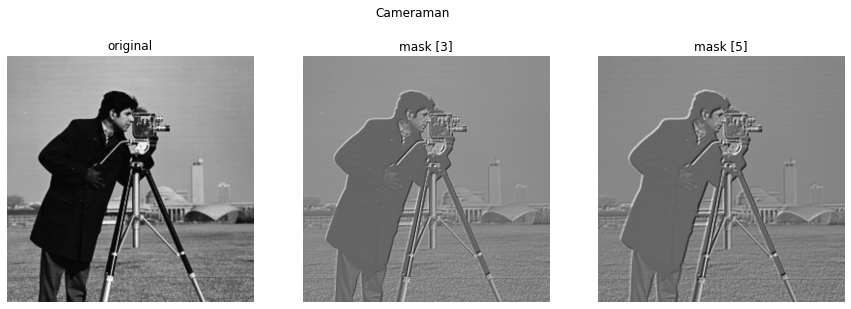

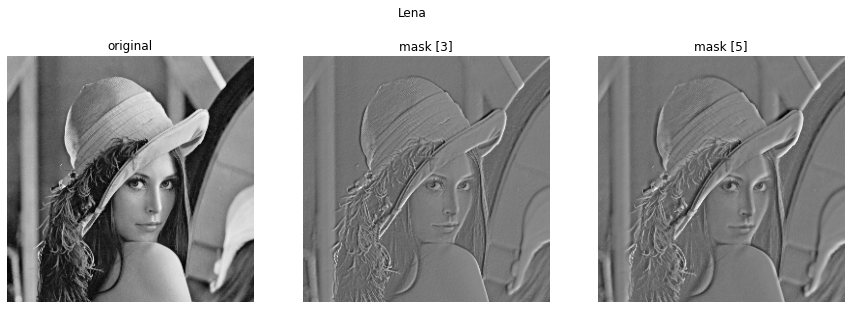

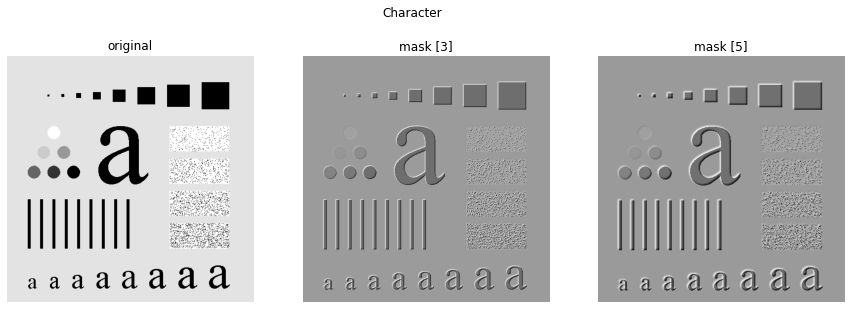

In [328]:
print("============================================== Without Noise : A = 1.4 ==========================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(3):
    subplot(1,3,j+1)
    s = images[i].shape
    s1, s2 = s[0] -masks[j] +1, s[1] -masks[j] +1
    A = 1.4
    a_original = A*images[i][:s1,:s2].astype(float)
    lowpass = scaled(apply_filter(images[i], highboost_filter, masks[j])).astype(float)
    res = scaled(a_original - lowpass).astype(int)
    imshow(res,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

============================================== With Noise : A = 1.4 ==========================================


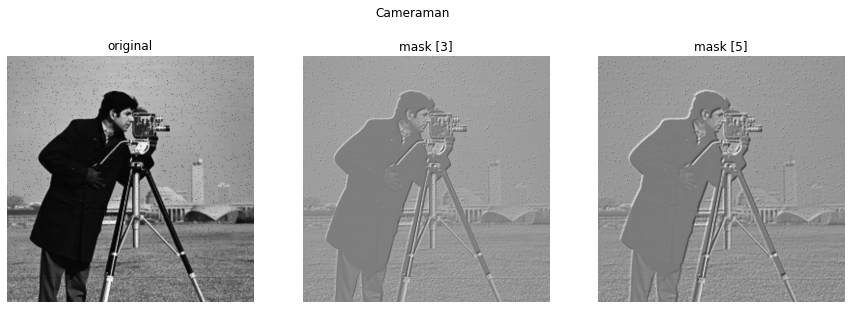

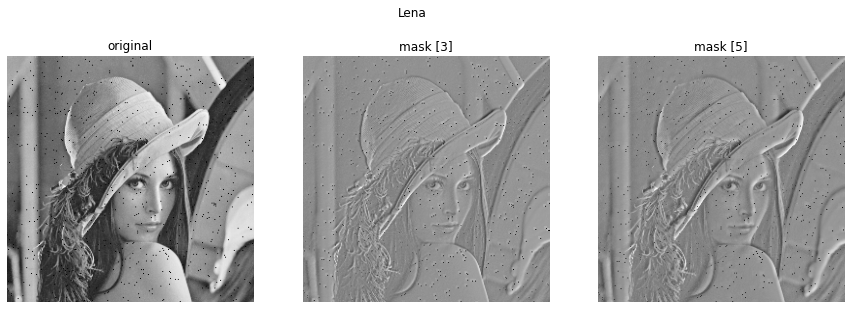

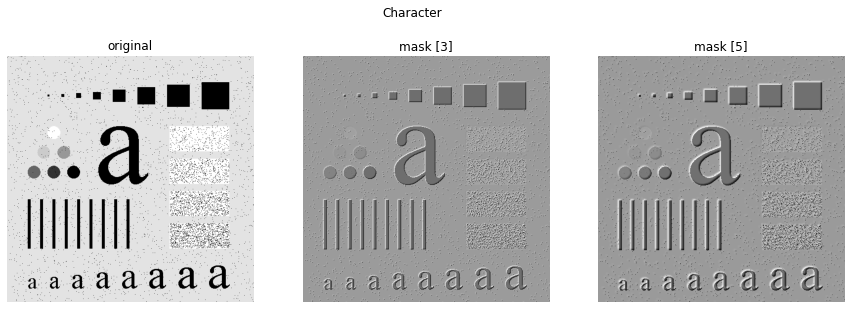

In [329]:
print("============================================== With Noise : A = 1.4 ==========================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(15,5))
  noisy_image = noisy(images[i])
  for j in range(3):
    subplot(1,3,j+1)
    s = noisy_image.shape
    s1, s2 = s[0] -masks[j] +1, s[1] -masks[j] +1
    A = 1.4
    a_original = A*noisy_image[:s1,:s2].astype(float)
    lowpass = scaled(apply_filter(noisy_image, highboost_filter, masks[j])).astype(float)
    res = scaled(a_original - lowpass).astype(int)
    imshow(res,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

##(vii). Gaussian Filter

In [330]:
def gaussian_filter(mask_image):
    n = mask_image.shape[0]
    if n == 1: 
      w = np.array([[1]])
    elif n == 3:
      w = np.array([[1,2,1],[2,4,2],[1,2,1]])/16
    else:
      w = np.array([[1 ,4 ,7 ,4 ,1],[4 ,16 ,26 ,16 ,4],[7 ,26 ,41 ,26 ,7],[4 ,16 ,26 ,16 ,4],[1 ,4 ,7 ,4 ,1]])/273
    res = np.multiply(w,mask_image)
    return np.sum(res)

============================================== Without Noise ==========================================


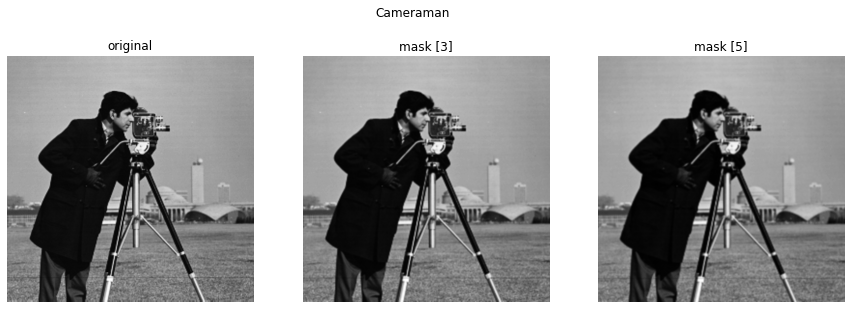

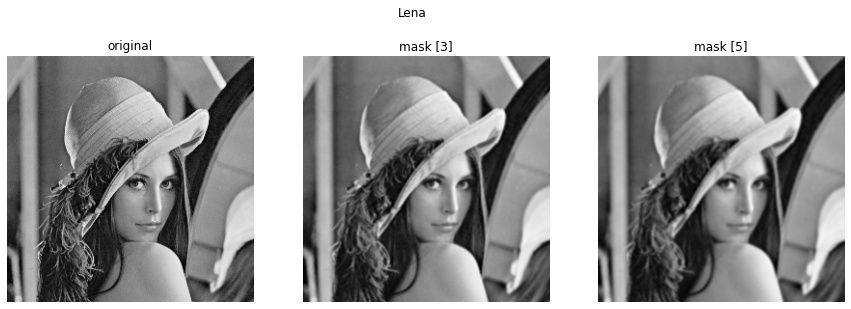

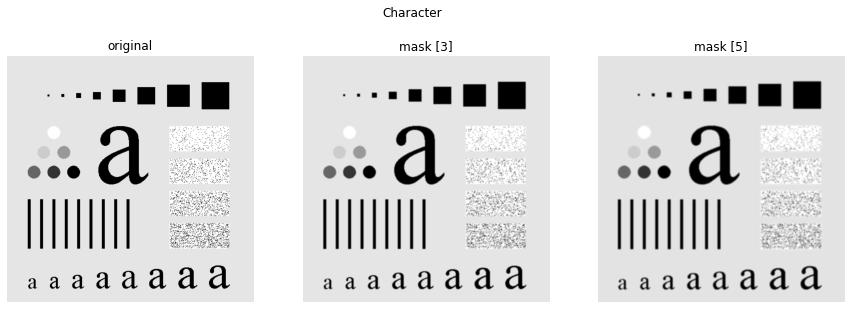

In [331]:
print("============================================== Without Noise ==========================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(images[i], gaussian_filter, masks[j]).astype(float)
    g = scaled(g).astype(int)
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

============================================== With Noise ==========================================


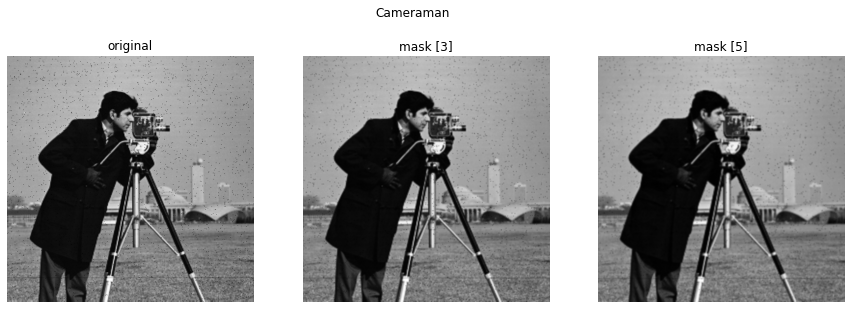

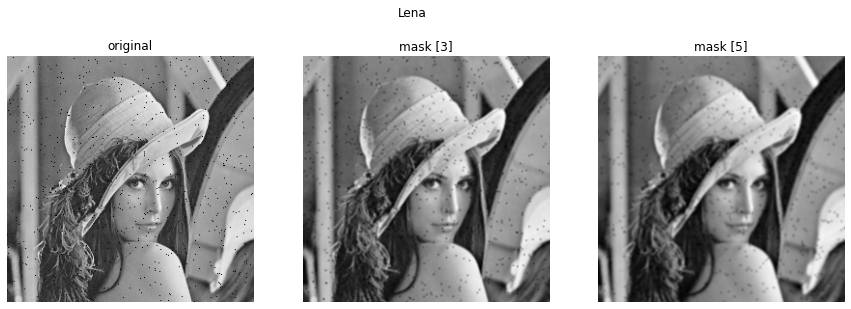

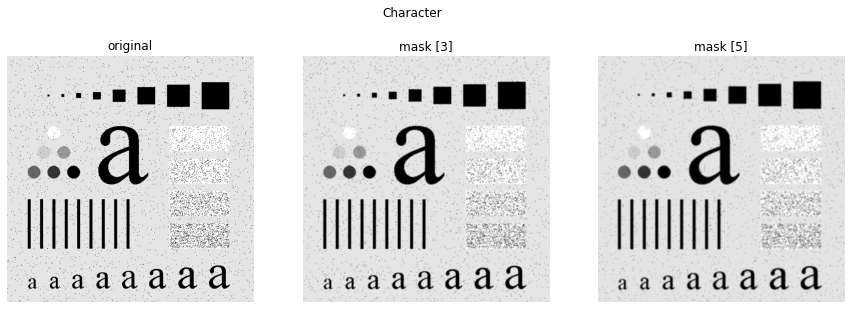

In [332]:
print("============================================== With Noise ==========================================")
masks = [1,3,5]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(3):
    subplot(1,3,j+1)
    g = apply_filter(noisy(images[i]), gaussian_filter, masks[j]).astype(float)
    g = scaled(g).astype(int)
    imshow(g,'gray')
    title( 'original' if j == 0 else 'mask [' + str(masks[j]) + ']')
    axis('off')
  suptitle(titles[i])
  show()

##(viii). Robert's Method

In [333]:
def roberts_filter(mask_image):
    w1 = np.array([[1,0],[0,-1]])
    w2 = np.array([[0,1],[-1,0]])
    dfdx = np.sum(np.multiply(w1,mask_image)).astype(float)
    dfdy = np.sum(np.multiply(w2,mask_image)).astype(float)
    result = np.sqrt(dfdx**2 + dfdy**2)
    return result.astype(int)

============================================== Without Noise ==========================================


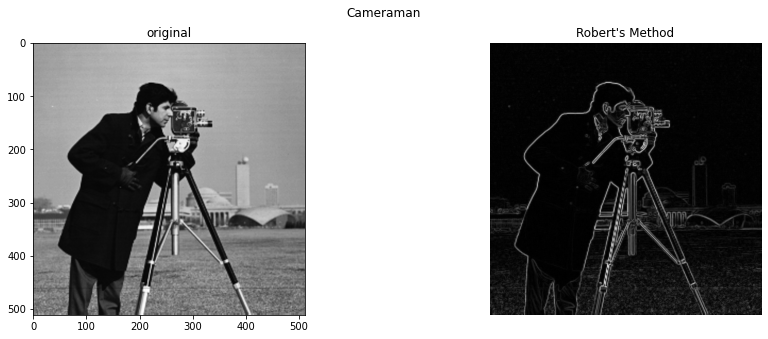

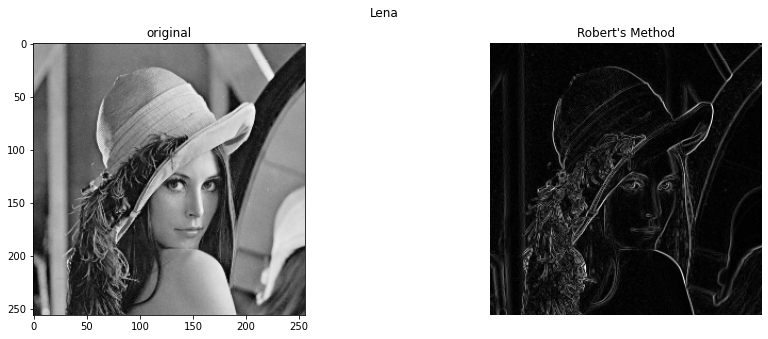

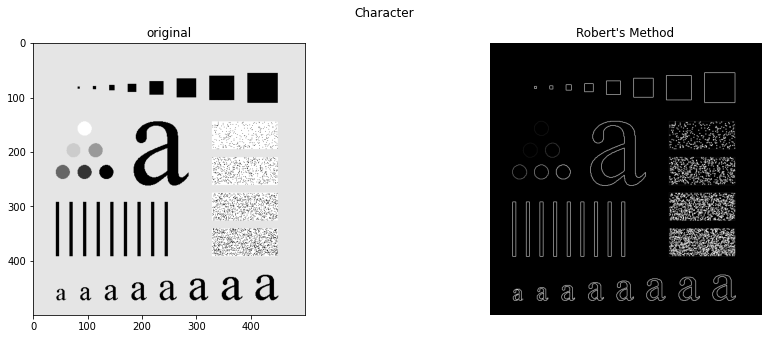

In [334]:
print("============================================== Without Noise ==========================================")
masks = [2]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(len(masks)):
    subplot(1,2,1)
    imshow(images[i],'gray')
    title('original')
    subplot(1,2,j+2)
    g = apply_filter(images[i], roberts_filter, masks[j])
    imshow(g,'gray')
    title( "Robert's Method")
    axis('off')
    suptitle(titles[i])
    show()

============================================== With Noise ==========================================


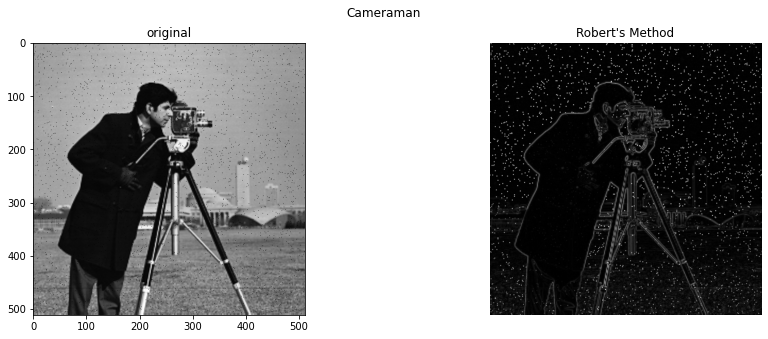

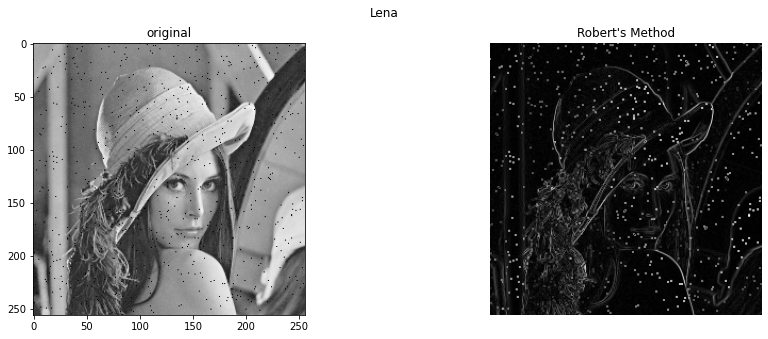

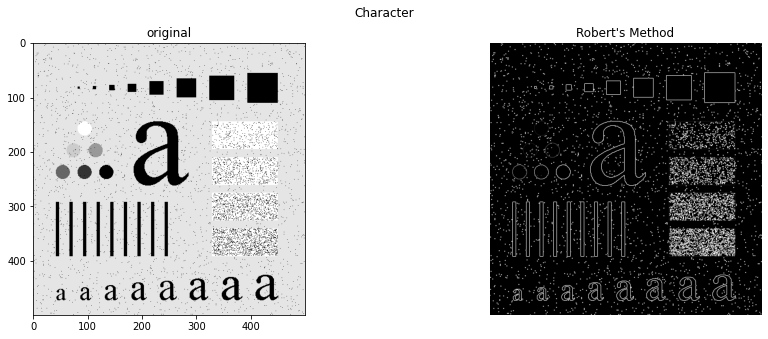

In [335]:
print("============================================== With Noise ==========================================")
masks = [2]
for i in range(3):
  figure(figsize=(15,5))
  noisy_image = noisy(images[i])
  for j in range(len(masks)):
    subplot(1,2,1)
    imshow(noisy_image,'gray')
    title('original')
    subplot(1,2,j+2)
    g = apply_filter(noisy_image, roberts_filter, masks[j])
    imshow(g,'gray')
    title( "Robert's Method")
    axis('off')
    suptitle(titles[i])
    show()

##(viii). Sobel's Method

In [336]:
def sobels_filter(mask_image):
    w1 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])
    w2 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])
    dfdx = np.sum(np.multiply(w1,mask_image)).astype(float)
    dfdy = np.sum(np.multiply(w2,mask_image)).astype(float)
    result = np.sqrt(dfdx**2 + dfdy**2)
    return result.astype(int)

============================================== Without Noise ==========================================


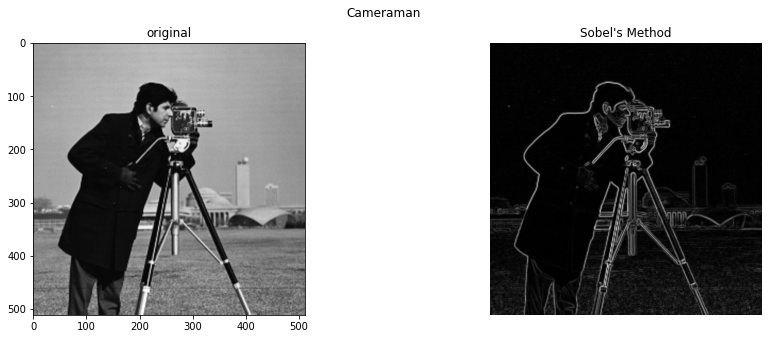

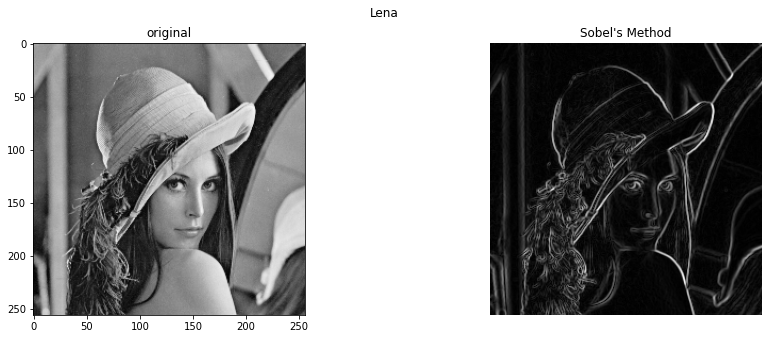

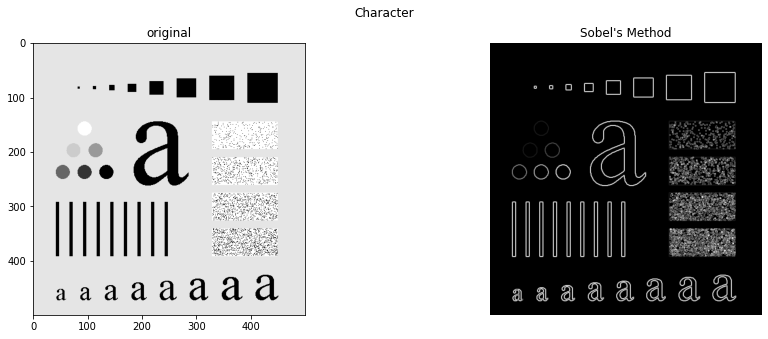

In [337]:
print("============================================== Without Noise ==========================================")
masks = [3]
for i in range(3):
  figure(figsize=(15,5))
  for j in range(len(masks)):
    subplot(1,2,1)
    imshow(images[i],'gray')
    title('original')
    subplot(1,2,j+2)
    g = apply_filter(images[i], sobels_filter, masks[j])
    imshow(g,'gray')
    title( "Sobel's Method")
    axis('off')
    suptitle(titles[i])
    show()

============================================== With Noise ==========================================


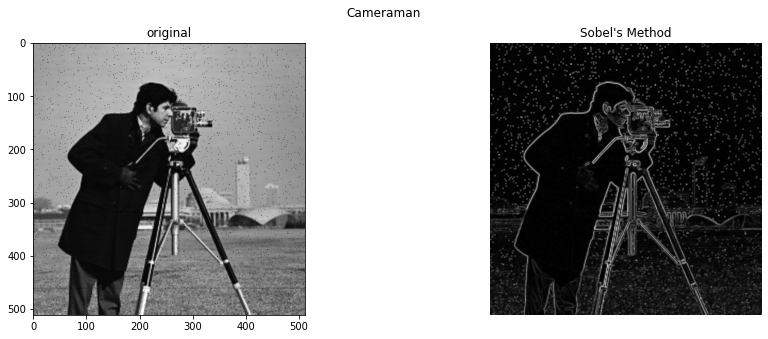

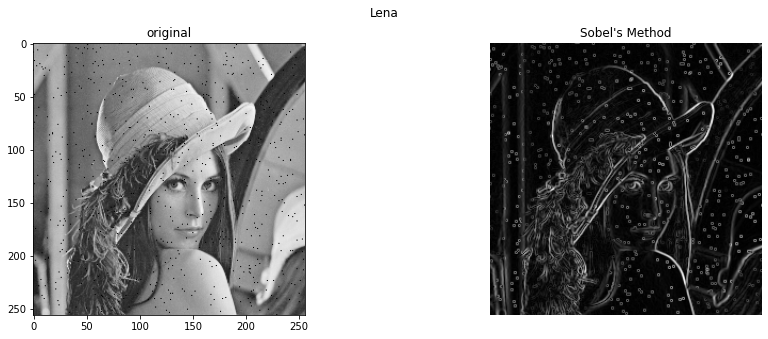

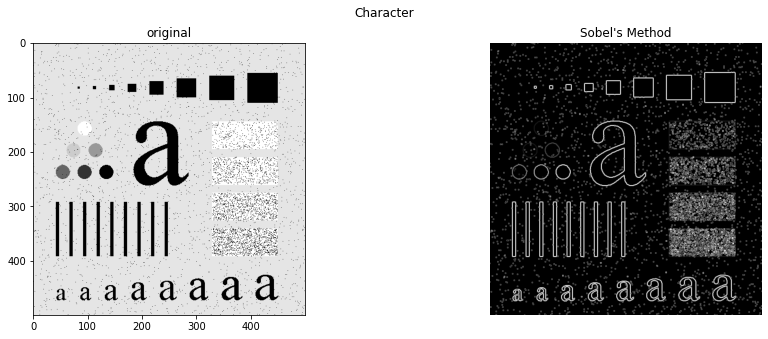

In [338]:
print("============================================== With Noise ==========================================")
masks = [3]
for i in range(3):
  figure(figsize=(15,5))
  noisy_image = noisy(images[i])
  for j in range(len(masks)):
    subplot(1,2,1)
    imshow(noisy_image,'gray')
    title('original')
    subplot(1,2,j+2)
    g = apply_filter(noisy_image, sobels_filter, masks[j])
    imshow(g,'gray')
    title( "Sobel's Method")
    axis('off')
    suptitle(titles[i])
    show()

#Question 2

In [339]:
def convolution(f,g):
  n = f.shape[0]
  result = np.zeros(n)
  new_f = np.tile(f,2)
  for i in range(n):
    result[i] = np.sum(g*new_f[i:i+n])
  return result

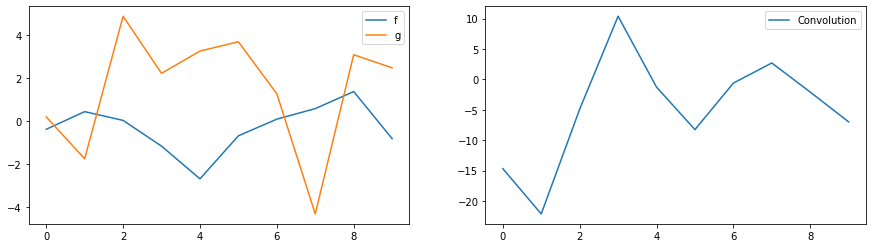

In [340]:
figure(figsize=(15,4))
f = np.random.normal(0,1,size=10)
g = np.random.normal(0,3,size=10)

subplot(1,2,1)
plot(f,label='f')
plot(g,label='g')
legend(loc='best')

subplot(1,2,2)
conv = convolution(f,g)
plot(conv,label='Convolution')
legend(loc='best')
show()

# Question 3

In [6]:
  ### Generalised dft
  ### p = 1, for applying dft
  ### p = -1, for applying Inverse dft

  def dft(x, p = 1):
    N = x.shape[0]
    k, n = np.meshgrid(np.linspace(0,N-1,N), np.linspace(0,N-1,N))
    coeff = np.exp(p * -2j * np.pi * k * n/N)
    X =  np.sum(x*coeff, 1)
    return X if p > 0 else X/N

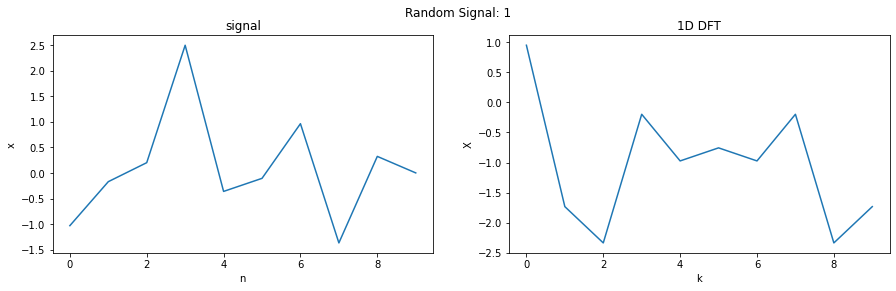

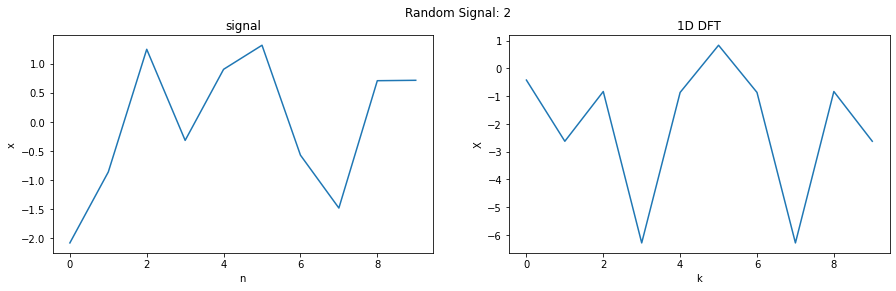

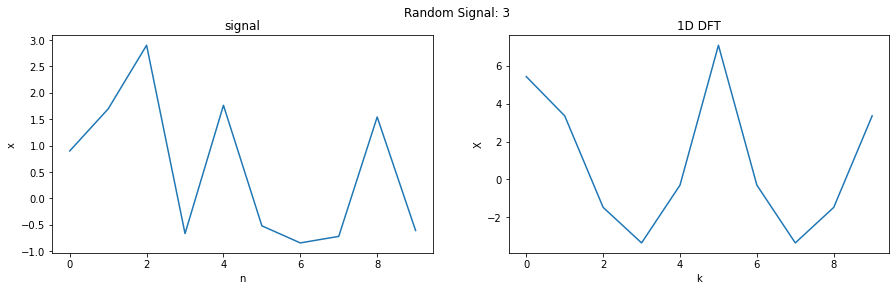

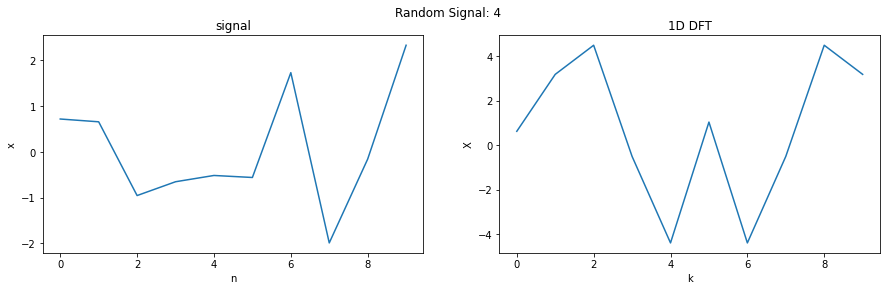

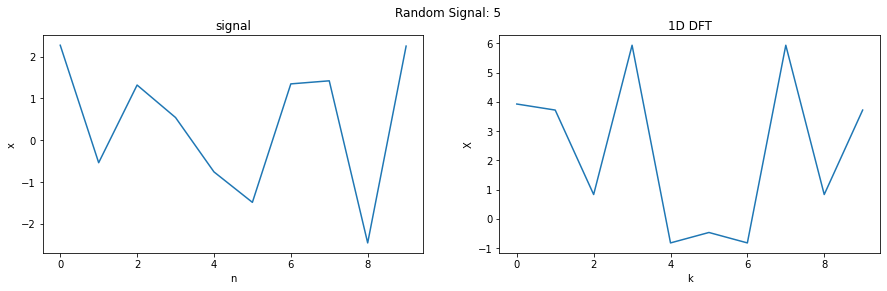

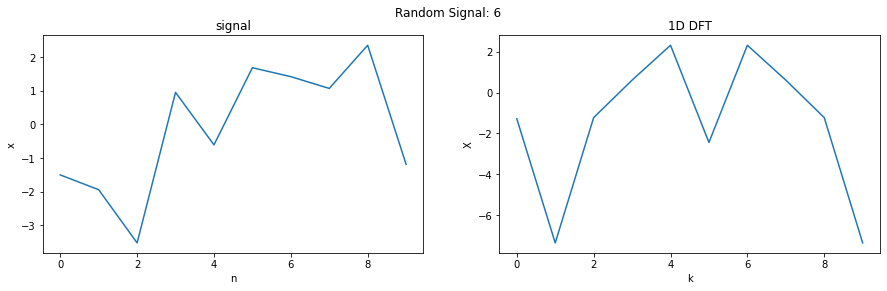

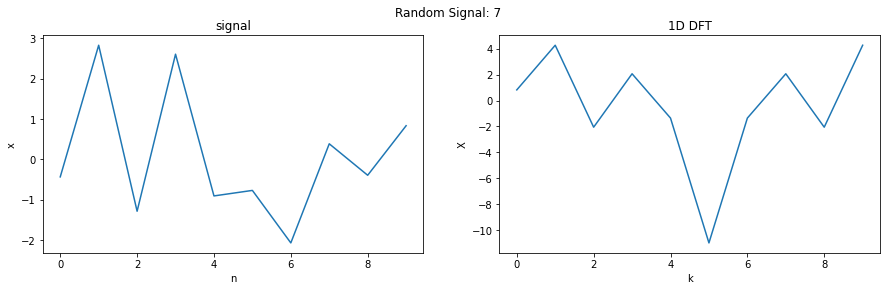

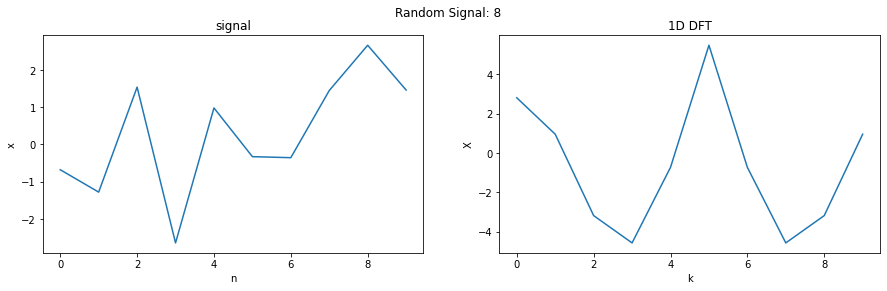

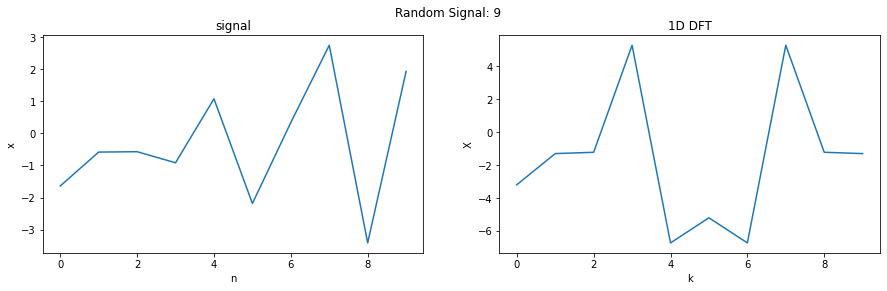

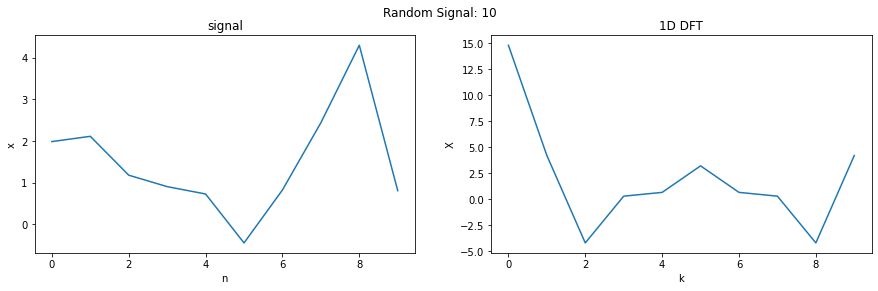

In [342]:
for i in range(10):  
  figure(figsize=(15,4))
  x = np.random.normal(0,(i+1)**(0.25),size=10)

  subplot(1,2,1)
  plot(x)
  title('signal')
  xlabel('n')
  ylabel('x')

  subplot(1,2,2)
  result = dft(x)
  plot(np.real(result))
  title('1D DFT')
  xlabel('k')
  ylabel('X')

  suptitle('Random Signal: '+str(i+1))
  show()

#Question 4

In [7]:
### Generalised dft_2d
### p = 1, for applying dft
### p = -1, for applying Inverse dft

def dft_2d(f, p = 1):
    M, N = f.shape
    F = np.zeros(f.shape,dtype=np.complex64)

    for u in range(M):
      F[u,:] = dft(f[u,:], p)
    
    for v in range(N):
      F[:,v] = dft(F[:,v], p)
    
    return F

==============================================  Without Noise  ==============================================


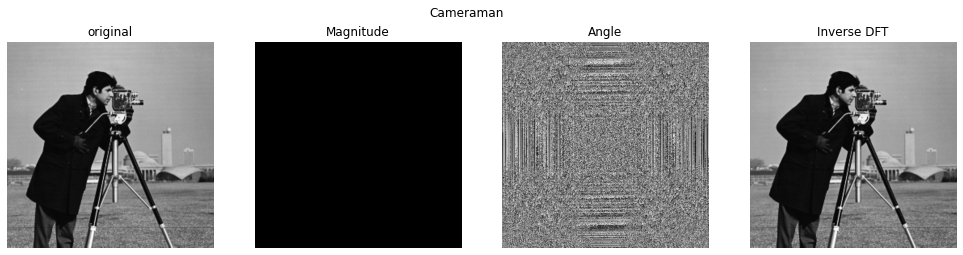

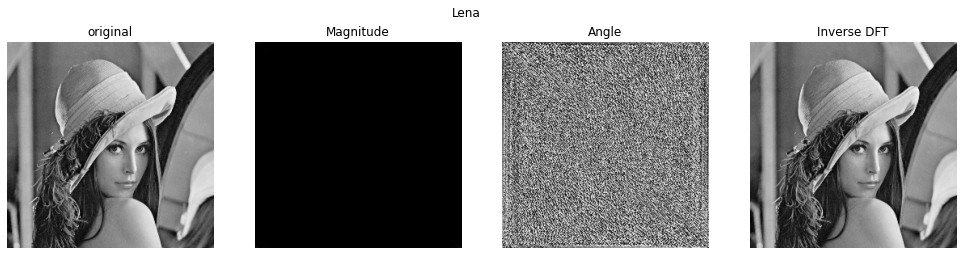

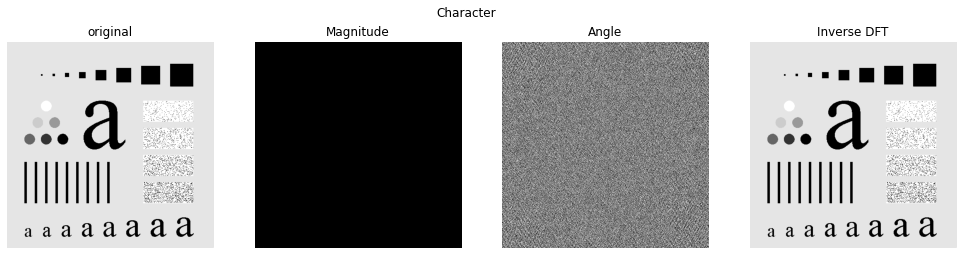

In [273]:
print("==============================================  Without Noise  ==============================================")

for i in range(len(images)):  
  figure(figsize=(17,4))

  image = images[i]

  subplot(1,4,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  result = dft_2d(image)

  subplot(1,4,2)
  imshow(np.absolute(result),'gray')
  title('Magnitude')
  axis('off')

  subplot(1,4,3)
  imshow(np.angle(result),'gray')
  title('Angle')
  axis('off')

  result = dft_2d(result, -1)

  subplot(1,4,4)
  imshow(result.astype(np.uint8),'gray')
  title('Inverse DFT')
  axis('off')

  suptitle(titles[i])
  show()

==============================================  With Noise  ==============================================


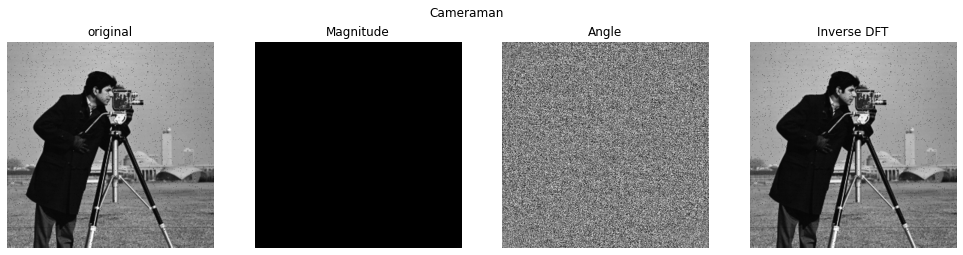

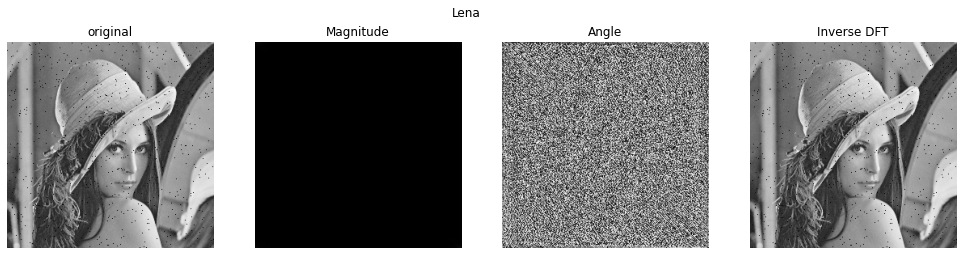

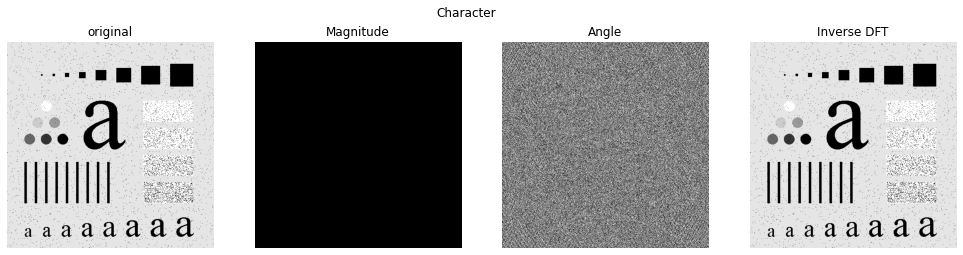

In [274]:
print("==============================================  With Noise  ==============================================")

for i in range(len(images)):  
  figure(figsize=(17,4))

  image = noisy(images[i])

  subplot(1,4,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  result = dft_2d(image)

  subplot(1,4,2)
  imshow(np.absolute(result),'gray')
  title('Magnitude')
  axis('off')

  subplot(1,4,3)
  imshow(np.angle(result),'gray')
  title('Angle')
  axis('off')

  result = dft_2d(result, -1)

  subplot(1,4,4)
  imshow(result.astype(np.uint8),'gray')
  title('Inverse DFT')
  axis('off')

  suptitle(titles[i])
  show()

#Question 5

In [9]:
for i in range(len(images)):
  images[i] = cv2.resize(images[i],(128,128))

def transform(image):
  res = np.copy(image)
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      res[i][j] *= -1 if (i + j)%2 else 1
  return res

dft_transform = {}

for i in images:
  dft_transform[i] = [0,0]
  dft_transform[i][0] = dft_2d(transform(images[i]))
  dft_transform[i][1] = dft_2d(transform(noisy(images[i])))

## (i). Notch Filter

In [19]:
def notch(i, d0= 3, noisy = 0):

  M,N = images[i].shape
  
  r,c = M//2, N//2

  H = np.ones((M,N))
  H[r-d0:r+d0+1,c-d0:c+d0+1] = 0

  F = dft_transform[i][noisy]

  output = dft_2d(H*F, -1)

  return transform(output)

====================================== Without Noise ===========================================


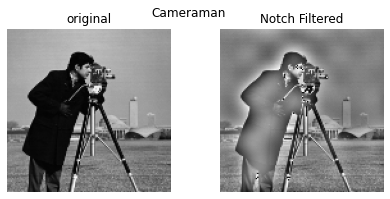

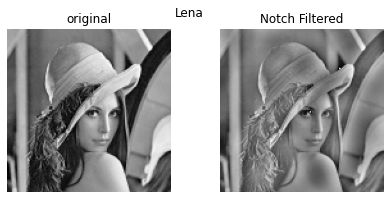

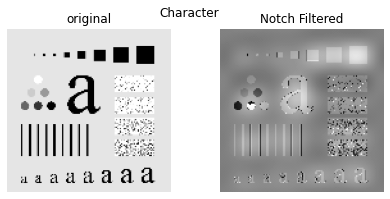

In [23]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = notch(i, d0= 4)
  imshow(result.astype(np.uint8),'gray')
  title('Notch Filtered')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


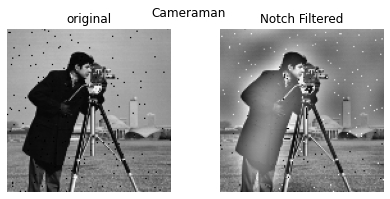

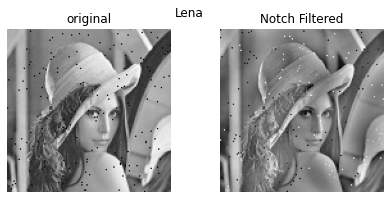

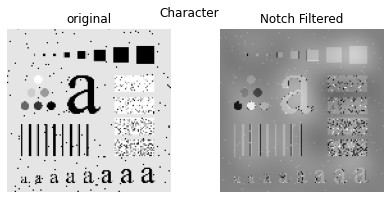

In [24]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = notch(i, d0= 3, noisy= 1)
  imshow(result.astype(np.uint8),'gray')
  title('Notch Filtered')
  axis('off')

  suptitle(titles[i])
  show()

##(ii). Ideal Lowpass Filter

In [15]:
def ideal_lowpass(i, d0= 200, noisy = 0):

  M,N = images[i].shape
   
  r,c = M//2, N//2

  H = np.zeros((M,N))
  for u in range(M):
    for v in range(N):
      if ((u-r)**2) + ((v-c)**2) <= (d0**2):
        H[u][v] = 1
  
  #F = dft_transform[i][noisy]
  F = dft_2d(transform(image))

  output = dft_2d(H*F, -1)

  return transform(output)

====================================== Without Noise ===========================================


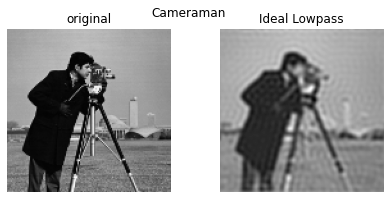

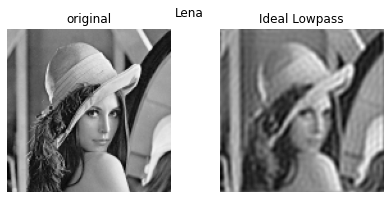

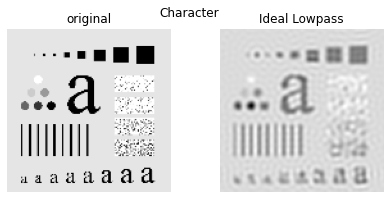

In [18]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = ideal_lowpass(i,25 )
  #imshow(scaled(result),'gray')
  imshow(result.astype(np.int64),'gray')
  title('Ideal Lowpass')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


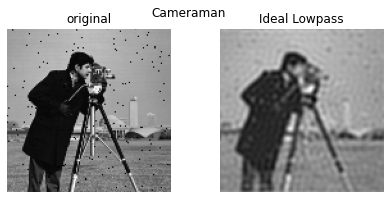

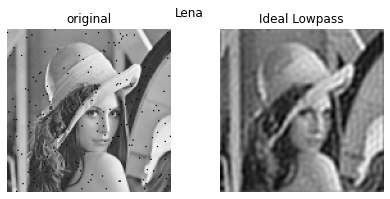

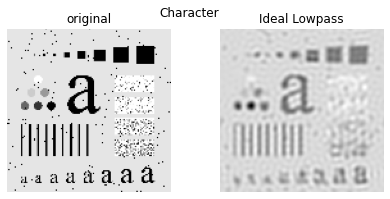

In [27]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = ideal_lowpass(i, d0= 25, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Ideal Lowpass')
  axis('off')

  suptitle(titles[i])
  show()

##(iii). Butterworth Lowpass Filter

In [75]:
def butterworth_lowpass(i, d0= 15, n= 2, noisy = 0):

  M,N = images[i].shape
  
  r,c = M//2, N//2

  F = dft_2d(transform(image.astype(np.int64)))

  HF = np.ones((M,N),dtype=np.complex64)

  for u in range(N):
    for v in range(M):
      d = ((u-c)**2 + (v-r)**2) / (d0**2)
      factor = 1 + np.power(d,n)
      HF[u][v] = F[u][v] / factor

  output = dft_2d(HF, -1)

  return transform(output)

====================================== Without Noise ===========================================


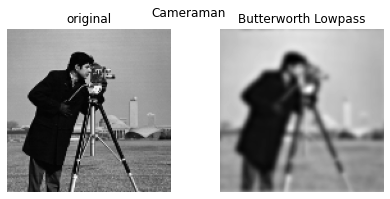

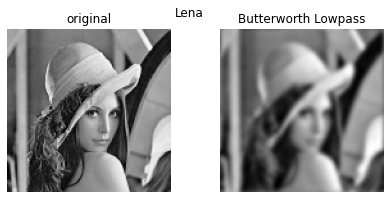

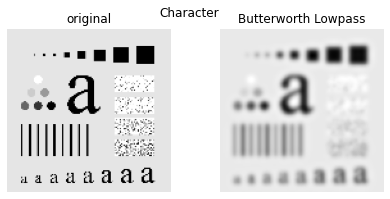

In [76]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = butterworth_lowpass(i)
  imshow(result.astype(np.int64),'gray')
  title('Butterworth Lowpass')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


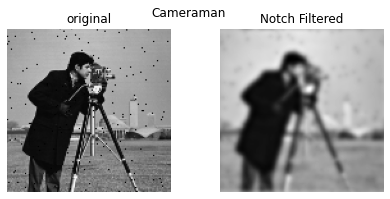

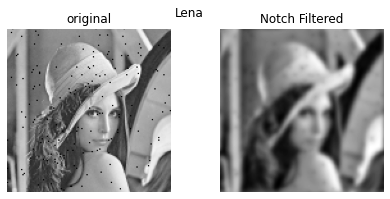

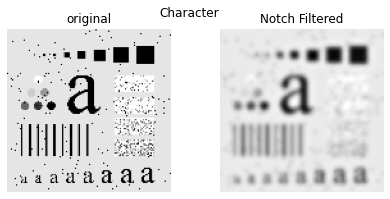

In [77]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = butterworth_lowpass(i, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Notch Filtered')
  axis('off')

  suptitle(titles[i])
  show()

##(iv). Gaussian lowpass Filter

In [55]:
def gaussian_lowpass(i, d0, noisy = 0):

  M,N = images[i].shape
  
  r,c = M//2, N//2

  F = dft_transform[i][noisy]

  HF = np.zeros((M,N),dtype=np.complex64)

  for u in range(M):
    for v in range(N):
      d = ((u-r) ** 2 + (v-c) ** 2) / (d0**2)
      HF[u][v] = F[u][v] * np.exp(-(d/2))

  output = dft_2d(HF, -1)

  return transform(output)

====================================== Without Noise ===========================================


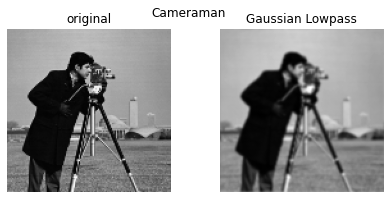

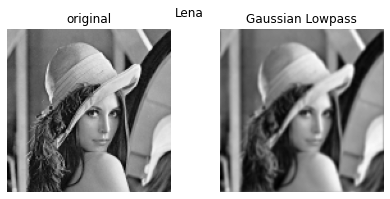

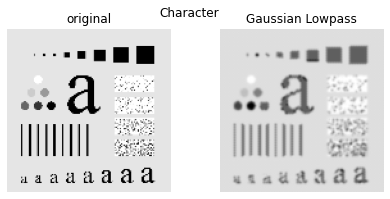

In [103]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = gaussian_lowpass(i, d0= 25)
  imshow(result.astype(np.int64),'gray')
  title('Gaussian Lowpass')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


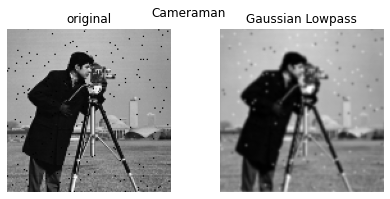

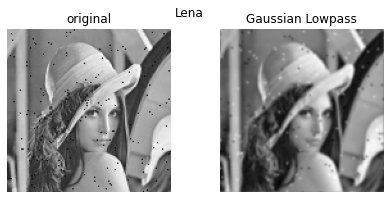

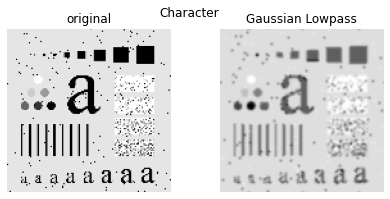

In [102]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = gaussian_lowpass(i, d0= 25, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Gaussian Lowpass')
  axis('off')

  suptitle(titles[i])
  show()

##(v). Ideal Highpass Filter

In [65]:
def highpass(i, d0, noisy = 0):

  M,N = images[i].shape
   
  r,c = M//2, N//2

  H = np.ones((M,N))
  for u in range(M):
    for v in range(N):
      if ((u-r)**2) + ((v-c)**2) <= (d0**2):
        H[u][v] = 0
  
  #F = dft_transform[i][noisy]
  F = dft_2d(transform(image.astype(np.int64)))

  output = dft_2d(H*F, -1)

  return transform(output)

====================================== Without Noise ===========================================


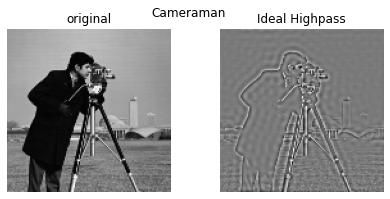

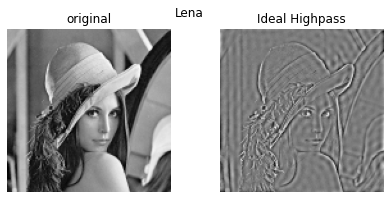

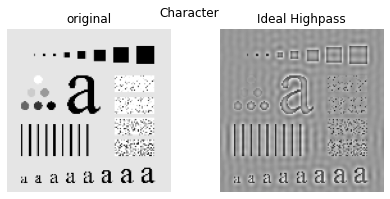

In [100]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = highpass(i, d0= 20)
  imshow(result.astype(np.int64),'gray')
  title('Ideal Highpass')
  axis('off')

  suptitle(titles[i])
  show()
## Note: Input image type and output image type should be same

====================================== With Noise ===========================================


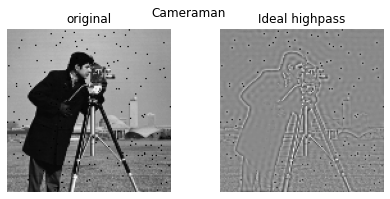

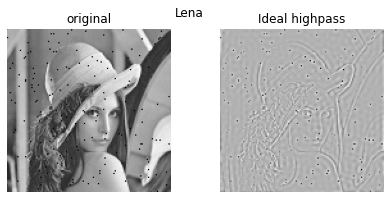

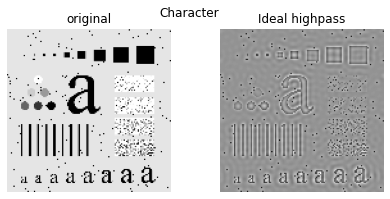

In [101]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = highpass(i, d0= 25, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Ideal highpass')
  axis('off')

  suptitle(titles[i])
  show()

##(vi). Butterworth Highpass Filter

In [81]:
def butterworth_highpass(i, d0, n= 2, noisy = 0):

  M,N = images[i].shape
  
  r,c = M//2, N//2

  F = dft_2d(transform(image.astype(np.int64)))

  HF = np.ones((M,N),dtype=np.complex64)

  eps = 1e-5

  for u in range(N):
    for v in range(M):
      d = ((u-c)**2 + (v-r)**2 + eps) / (d0**2)
      factor = 1 + np.power(1/d,n)
      HF[u][v] = F[u][v] / factor

  output = dft_2d(HF, -1)

  return transform(output)

====================================== Without Noise ===========================================


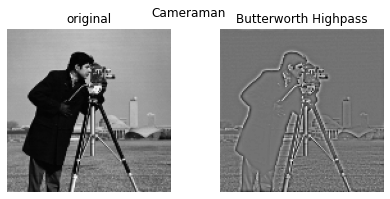

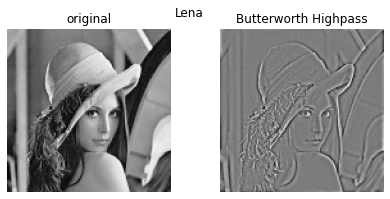

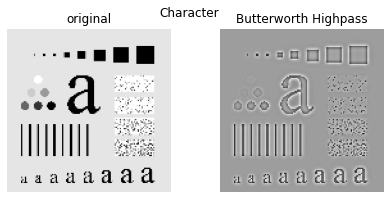

In [99]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = butterworth_highpass(i, d0= 20)
  imshow(result.astype(np.int64),'gray')
  title('Butterworth Highpass')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


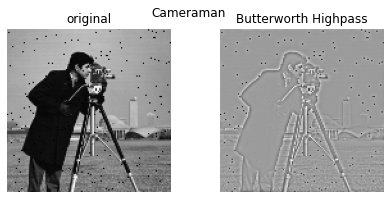

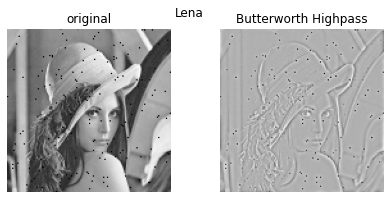

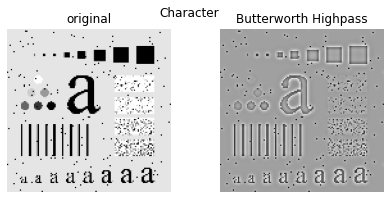

In [89]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = butterworth_highpass(i, d0= 20, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Butterworth Highpass')
  axis('off')

  suptitle(titles[i])
  show()

##(vii). Gaussian Highpass Filter

In [93]:
def gaussian_highpass(i, d0, noisy = 0):

  M,N = images[i].shape
  
  r,c = M//2, N//2

  F = dft_2d(transform(image.astype(np.int64)))

  HF = np.zeros((M,N),dtype=np.complex64)

  eps = 1e-5

  for u in range(M):
    for v in range(N):
      d = ((u-r) ** 2 + (v-c) ** 2 + eps) / (d0**2)
      HF[u][v] = F[u][v] * np.exp(-(2/d))

  output = dft_2d(HF, -1)

  return transform(output)

====================================== Without Noise ===========================================


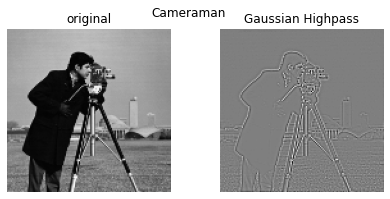

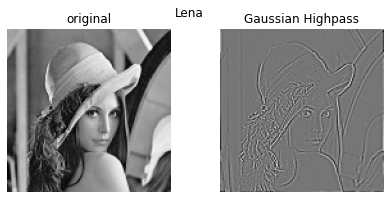

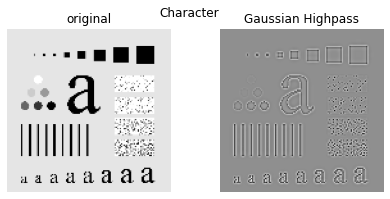

In [98]:
print('====================================== Without Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = images[i]
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = gaussian_highpass(i, d0= 25)
  imshow(result.astype(np.int64),'gray')
  title('Gaussian Highpass')
  axis('off')

  suptitle(titles[i])
  show()

====================================== With Noise ===========================================


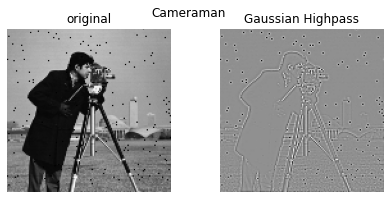

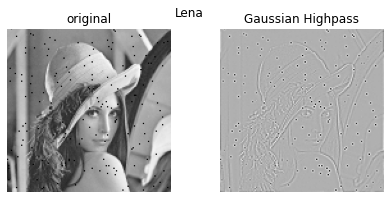

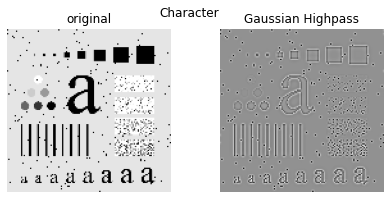

In [97]:
print('====================================== With Noise ===========================================')

for i in range(len(images)):  

  figure(figsize=(7,3))

  image = noisy(images[i])
  subplot(1,2,1)
  imshow(image,'gray')
  title('original')
  axis('off')
  
  subplot(1,2,2)
  result = gaussian_highpass(i, d0= 25, noisy= 1)
  imshow(result.astype(np.int64),'gray')
  title('Gaussian Highpass')
  axis('off')

  suptitle(titles[i])
  show()